In [1]:
# Import Required Libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio
pio.templates.default = "plotly_dark"


sns.set_style('whitegrid')

In [2]:
#  Load the Dataset

df = pd.read_csv('BigBasket.csv')

In [3]:
#  Initial Data Exploration

print('Shape of dataset:', df.shape)
print('\nColumn Names:\n', df.columns)

Shape of dataset: (27555, 10)

Column Names:
 Index(['index', 'product', 'category', 'sub_category', 'brand', 'sale_price',
       'market_price', 'type', 'rating', 'description'],
      dtype='object')


In [4]:
# Preview data
df.head()

,index,product,category,sub_category,brand,sale_price,market_price,type,rating,description
0,1,Garlic Oil - Vegetarian Capsule 500 mg,Beauty & Hygiene,Hair Care,Sri Sri Ayurveda,220.0,220.0,Hair Oil & Serum,4.1,This Product contains Garlic Oil that is known...
1,2,Water Bottle - Orange,"Kitchen, Garden & Pets",Storage & Accessories,Mastercook,180.0,180.0,Water & Fridge Bottles,2.3,"Each product is microwave safe (without lid), ..."
2,3,"Brass Angle Deep - Plain, No.2",Cleaning & Household,Pooja Needs,Trm,119.0,250.0,Lamp & Lamp Oil,3.4,"A perfect gift for all occasions, be it your m..."
3,4,Cereal Flip Lid Container/Storage Jar - Assort...,Cleaning & Household,Bins & Bathroom Ware,Nakoda,149.0,176.0,"Laundry, Storage Baskets",3.7,Multipurpose container with an attractive desi...
4,5,Creme Soft Soap - For Hands & Body,Beauty & Hygiene,Bath & Hand Wash,Nivea,162.0,162.0,Bathing Bars & Soaps,4.4,Nivea Creme Soft Soap gives your skin the best...


In [5]:
# Random sample
df.sample(5)

,index,product,category,sub_category,brand,sale_price,market_price,type,rating,description
23842,23843,Flax Seeds,Gourmet & World Food,"Snacks, Dry Fruits, Nuts",The Nibble Box,15.0,15.0,Dry Fruits & Berries,NaN,Flax seeds are one of the richest sources of O...
14058,14059,Ice Cube Tray - Green,"Kitchen, Garden & Pets",Storage & Accessories,Ratan,89.0,111.0,Racks & Holders,4.2,"These ice cube trays are long-lasting, and sim..."
12680,12681,Hair Oil - Flaky,Beauty & Hygiene,Hair Care,Aroma Magic,340.0,400.0,Hair Oil & Serum,NaN,Flaky Hair Oil from Aroma Magic helps to contr...
15447,15448,Fresh Aromatic,Beauty & Hygiene,Fragrances & Deos,Fogg,220.0,275.0,Men's Deodorants,4.0,"Soothing experience throughout the day, Consis..."
7481,7482,Pet Sobo Container Set - Silver,"Kitchen, Garden & Pets",Storage & Accessories,Steelo,209.0,273.0,Containers Sets,3.8,Steelo plastic container set is made of 100% f...


In [6]:
df.shape


(27555, 10)

In [7]:
# Dataset info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27555 entries, 0 to 27554
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   index         27555 non-null  int64  
 1   product       27554 non-null  object 
 2   category      27555 non-null  object 
 3   sub_category  27555 non-null  object 
 4   brand         27554 non-null  object 
 5   sale_price    27549 non-null  float64
 6   market_price  27555 non-null  float64
 7   type          27555 non-null  object 
 8   rating        18919 non-null  float64
 9   description   27440 non-null  object 
dtypes: float64(3), int64(1), object(6)
memory usage: 2.1+ MB


In [8]:
df.describe(include='all')


,index,product,category,sub_category,brand,sale_price,market_price,type,rating,description
count,27555.00000,27554,27555,27555,27554,27549.000000,27555.000000,27555,18919.000000,27440
unique,NaN,23540,11,90,2313,NaN,NaN,426,NaN,21944
top,NaN,Turmeric Powder/Arisina Pudi,Beauty & Hygiene,Skin Care,Fresho,NaN,NaN,Face Care,NaN,A brand inspired by the Greek goddess of victo...
freq,NaN,26,7867,2294,638,NaN,NaN,1508,NaN,47
mean,13778.00000,NaN,NaN,NaN,NaN,334.648391,382.056664,NaN,3.943295,NaN
std,7954.58767,NaN,NaN,NaN,NaN,1202.102113,581.730717,NaN,0.739217,NaN
min,1.00000,NaN,NaN,NaN,NaN,2.450000,3.000000,NaN,1.000000,NaN
25%,6889.50000,NaN,NaN,NaN,NaN,95.000000,100.000000,NaN,3.700000,NaN
50%,13778.00000,NaN,NaN,NaN,NaN,190.320000,220.000000,NaN,4.100000,NaN
75%,20666.50000,NaN,NaN,NaN,NaN,359.000000,425.000000,NaN,4.300000,NaN


In [9]:
df.isnull().sum()


index              0
product            1
category           0
sub_category       0
brand              1
sale_price         6
market_price       0
type               0
rating          8636
description      115
dtype: int64

In [10]:
df.duplicated().sum()


np.int64(0)

In [11]:
# Drop duplicate rows
df = df.drop_duplicates()

In [12]:

# Fill numeric missing values with median
num_cols = df.select_dtypes(include=np.number).columns
df[num_cols] = df[num_cols].fillna(df[num_cols].median())

In [13]:
# Fill categorical missing values with mode
cat_cols = df.select_dtypes(include='object').columns
for col in cat_cols:
    df[col] = df[col].fillna(df[col].mode()[0])

df.isnull().sum()

index           0
product         0
category        0
sub_category    0
brand           0
sale_price      0
market_price    0
type            0
rating          0
description     0
dtype: int64

In [14]:
colors1 = px.colors.qualitative.Set2
colors2 = px.colors.qualitative.Bold
colors3 = px.colors.sequential.Blues


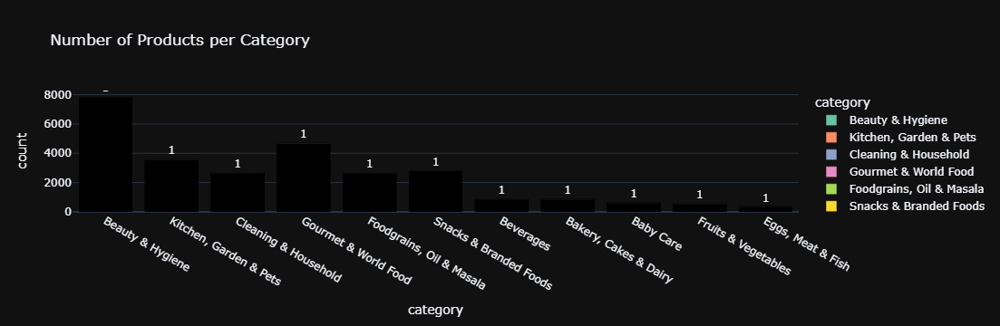

In [26]:
#Products Count by Category (Bar Chart)
# This bar chart shows the number of products available in each category,
# helping identify categories with the highest and lowest product variety.

fig = px.bar(
    df,
    x='category',
    title='Number of Products per Category',
    text_auto=True,
    color='category',
    color_discrete_sequence=colors1
)
fig.show()



In [27]:
#Average Price per Category
# This chart compares the average sale price across categories,
# providing insight into which categories are generally premium or affordable.

avg_price = df.groupby('category')['sale_price'].mean().reset_index()

fig = px.bar(
    avg_price,
    x='category',
    y='sale_price',
    title='Average Sale Price by Category',
    color='category',
    color_discrete_sequence=colors2
)
fig.show()


In [28]:
# Calculate discount percentage from market price and sale price
df['discount_percent'] = ((df['market_price'] - df['sale_price']) / df['market_price']) * 100

# Handle any infinite or negative values safely
df['discount_percent'] = df['discount_percent'].replace([float('inf'), -float('inf')], 0)
df['discount_percent'] = df['discount_percent'].clip(lower=0)


In [29]:
import plotly.express as px

colors1 = px.colors.qualitative.Set2

# Scatter plot to analyze relationship between sale price and discount percentage
fig = px.scatter(
    df,
    x='sale_price',
    y='discount_percent',
    title='Sale Price vs Discount Percentage',
    color='category',
    opacity=0.7,
    color_discrete_sequence=colors1
)

fig.update_layout(
    xaxis_title='Sale Price',
    yaxis_title='Discount (%)',
    title_x=0.5
)

fig.show()


In [30]:
#Distribution of Product Prices (Histogram)
# This histogram visualizes the distribution of product prices,
# helping understand common price ranges and price concentration.

fig = px.histogram(
    df,
    x='sale_price',
    nbins=40,
    title='Distribution of Product Prices',
    color_discrete_sequence=['#EF553B']
)
fig.show()



In [31]:
#Top 10 Most Expensive Products
# This horizontal bar chart highlights the top 10 most expensive products,
# helping identify premium products available on the platform.

top_expensive = df.sort_values(by='sale_price', ascending=False).head(10)

fig = px.bar(
    top_expensive,
    x='sale_price',
    y='product',
    orientation='h',
    title='Top 10 Most Expensive Products',
    color='sale_price',
    color_continuous_scale='Viridis'
)
fig.show()


In [32]:
#Rating Distribution (Box Plot)
# This box plot shows the overall distribution of product ratings,
# helping identify rating spread, median rating, and potential outliers.

fig = px.box(
    df,
    y='rating',
    title='Product Rating Distribution',
    color_discrete_sequence=['#00CC96']
)
fig.show()


In [33]:
#Ratings by Category (Violin Plot)
# This box plot shows the overall distribution of product ratings,
# helping identify rating spread, median rating, and potential outliers.

fig = px.violin(
    df,
    x='category',
    y='rating',
    box=True,
    title='Ratings by Category',
    color='category',
    color_discrete_sequence=colors2
)
fig.show()


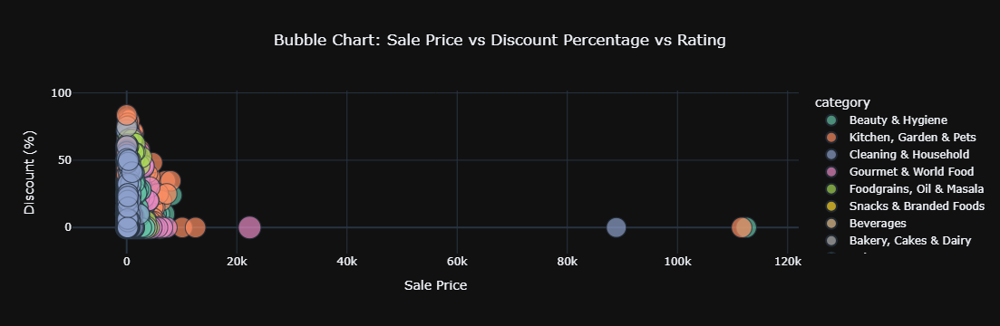

In [34]:
#Sale Price vs market_price (Bubble Chart)
# This bubble chart represents the relationship between sale price and discount,
# where bubble size indicates product rating and color represents category.


colors1 = px.colors.qualitative.Set2

# Bubble chart to analyze relationship between price, discount, and rating
fig = px.scatter(
    df,
    x='sale_price',
    y='discount_percent',
    size='rating',
    color='category',
    hover_name='product',
    title='Bubble Chart: Sale Price vs Discount Percentage vs Rating',
    opacity=0.7,
    size_max=25,
    color_discrete_sequence=colors1
)

fig.update_layout(
    xaxis_title='Sale Price',
    yaxis_title='Discount (%)',
    title_x=0.5
)

fig.show()


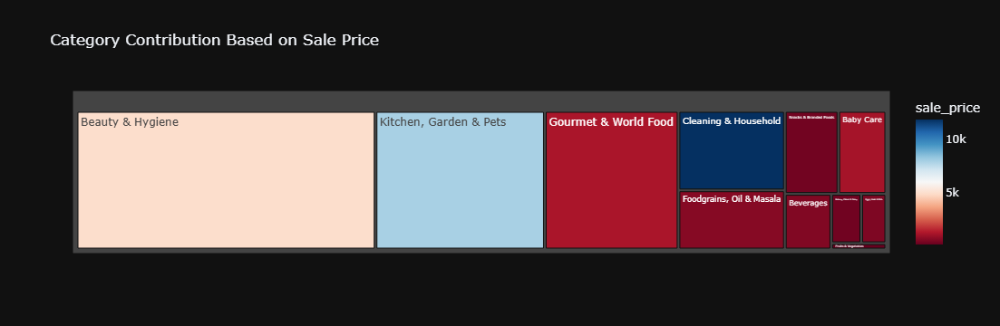

In [35]:
#Category Contribution (Treemap )
# This treemap visualizes category-wise contribution based on sale price,
# helping understand which categories contribute more to overall value.

fig = px.treemap(
    df,
    path=['category'],
    values='sale_price',
    title='Category Contribution Based on Sale Price',
    color='sale_price',
    color_continuous_scale='RdBu'
)
fig.show()


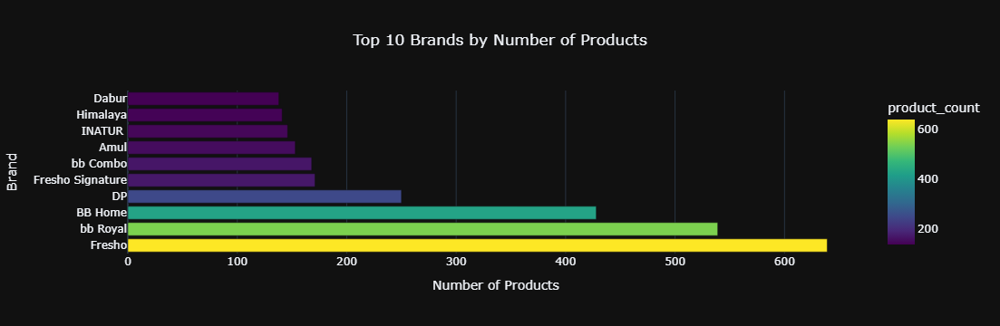

In [36]:
# Brand Analysis-Top 10 Brands by Product Count
# This chart displays the top 10 brands by number of products,
# highlighting brands with the strongest presence on the platform.

# Count products per brand
brand_count = (
    df.groupby('brand')
      .size()
      .reset_index(name='product_count')
      .sort_values(by='product_count', ascending=False)
      .head(10)
)

fig = px.bar(
    brand_count,
    x='product_count',
    y='brand',
    orientation='h',
    title='Top 10 Brands by Number of Products',
    color='product_count',
    color_continuous_scale='Viridis'
)

fig.update_layout(
    xaxis_title='Number of Products',
    yaxis_title='Brand',
    title_x=0.5
)

fig.show()



### Key Insights
- Grocery and household categories have the highest number of products.
- Premium products show higher prices but lower discounts.
- Some brands dominate the platform with a large product portfolio.
- Higher discounts are more common in packaged food categories.
- Product ratings remain consistent across most categories.


### Business Recommendations
- BigBasket can focus promotional discounts on slow-moving categories.
- High-rated products with low visibility should be highlighted.
- Brands with high product counts can be leveraged for partnerships.
- Categories with high discounts but low ratings need quality checks.
